# Домашнее задание

Data contains the book rating information. Ratings (Book-Rating) are either explicit, expressed on a scale from 1-10 (higher values denoting higher appreciation), or implicit, expressed by 0.

### 1. Реализовать персональный топ  - принимает на вход возраст и локацию, на выходе персональный топ   - 1 балл

Персональный топ - это топ товаров по похожим возрасту/интересам/локации. Как сделать? Разбить на сегменты по выбраным признакам. Топ делать по книгам с хорошим средним рейтингом.

### 2. На основе метода кластеризации похожих пользователей построить рекомендации (Слайд 27) - 2 балла

Нужно топ-10 рекомендаций с самой высокой оценкой. Считаем среднюю оценку для каждой книги по кластеру и выводим топ-10 книг.

### 3. Применить методы расмотренные на лекции (Совстречаемость - 2 балл, Content-based - 1 балл, Коллаборативная фильтрация - 3 балла (51 слайд), Матричная Факторизация - 1 балл) - 7 баллов

В совстречаемости также учитывать оценки. Вес пары книг встретившихся у пользователя - полусумма их оценок

Коллаборативную фильтрацию реализовывать как на слайде 50 презентации, посоветовав каждому пользователю топ-10 книг с самой высокой оценкой. Сделать рекомендации User-based и Item-based и сравнить.

Если совсем сложно - можно сделать как в семинарской части, поставив оценку "0", если рейтинг < 5 и "1" - в противном случае. Тогда максимум за это - 1 балл.

Для Content-based, Коллаборативной фильтрации, Матричной Факторизации реализовать U2I и I2I рекомендации

### Примечание:

Так как пользователей много - можно зафиксировать несколько произвольных и для них уже составлять рекомендации

Работоспособность I2I можно проверять на известных книгах (Гарри Поттер, Властелин Колец, Интервью с вампиром, Код-Да-Винчи, Маленький Принц)

Рейтинг книг обязательно нужно учитывать

Не забываем также предобработать данные - выкинуть выбросы-пользователей и выбросы-книги.

# Жесткий дедлайн 12 мая

Выводить в качестве рекомендаций лучше названия книг, картинки (если они есть) и соответствующие метрики близости.

In [ ]:
!pip install lightfm

     |████████████████████████████████| 317kB 6.5MB/s 
  Created wheel for lightfm: filename=lightfm-1.16-cp37-cp37m-linux_x86_64.whl size=705345 sha256=d31f4d83f0aa3ce9e8d0f55b80bac14dee13adf0486fab0d886d243052f8c6d8
  Stored in directory: /root/.cache/pip/wheels/c6/64/d4/673c7277f71ac4c5ad4835b94708c01b653ef2d3aa78ef20aa
Successfully built lightfm


In [ ]:
import numpy as np
import pandas as pd
import tqdm
import re
from lightfm import LightFM

In [ ]:
from io import BytesIO
from PIL import Image
import requests
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
import gensim
from scipy.sparse import coo_matrix, csr_matrix
from scipy.sparse.linalg import svds

In [ ]:
!mkdir ./data

!wget https://raw.githubusercontent.com/vadim0912/MLbase_2021_spring/main/lecture07/HW_files/BX-Book-Ratings.csv -O ./data/BX-Book-Ratings.csv
!wget https://raw.githubusercontent.com/vadim0912/MLbase_2021_spring/main/lecture07/HW_files/BX-Books.csv -O ./data/BX-Books.csv
!wget https://raw.githubusercontent.com/vadim0912/MLbase_2021_spring/main/lecture07/HW_files/BX-Users.csv -O ./data/BX-Users.csv

--2021-05-12 19:16:45--  https://raw.githubusercontent.com/vadim0912/MLbase_2021_spring/main/lecture07/HW_files/BX-Book-Ratings.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30682276 (29M) [text/plain]
Saving to: ‘./data/BX-Book-Ratings.csv’

./data/BX-Book-Rati 100%[===================>]  29.26M  86.0MB/s    in 0.3s    

2021-05-12 19:16:46 (86.0 MB/s) - ‘./data/BX-Book-Ratings.csv’ saved [30682276/30682276]

--2021-05-12 19:16:46--  https://raw.githubusercontent.com/vadim0912/MLbase_2021_spring/main/lecture07/HW_files/BX-Books.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected

In [ ]:
books = pd.read_csv("./data/BX-Books.csv")

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [ ]:
interactions = pd.read_csv("./data/BX-Book-Ratings.csv", sep=";", encoding = "ISO-8859-1")

In [ ]:
interactions = interactions[interactions["Book-Rating"] != 0]

In [ ]:
interactions

,User-ID,ISBN,Book-Rating
1,276726,0155061224,5
3,276729,052165615X,3
4,276729,0521795028,6
6,276736,3257224281,8
7,276737,0600570967,6
...,...,...,...
1149773,276704,0806917695,5
1149775,276704,1563526298,9
1149777,276709,0515107662,10
1149778,276721,0590442449,10


In [ ]:
books

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...
...,...,...,...,...,...,...,...,...
271355,0440400988,There's a Bat in Bunk Five,Paula Danziger,1988,Random House Childrens Pub (Mm),http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...
271356,0525447644,From One to One Hundred,Teri Sloat,1991,Dutton Books,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...
271357,006008667X,Lily Dale : The True Story of the Town that Ta...,Christine Wicker,2004,HarperSanFrancisco,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...
271358,0192126040,Republic (World's Classics),Plato,1996,Oxford University Press,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...


In [ ]:
books_meets = interactions.groupby("ISBN")["User-ID"].count().reset_index().rename(columns={"User-ID": "user_num"})

In [ ]:
user_meets = interactions.groupby("User-ID")["ISBN"].count().reset_index().rename(columns={"ISBN": "books_num"})

In [ ]:
interactions = interactions.merge(books_meets, on=["ISBN"]).merge(user_meets, on=["User-ID"])

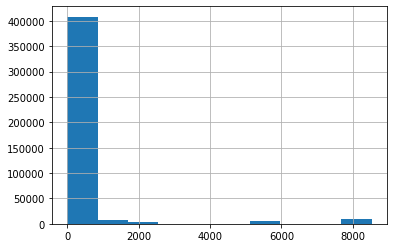

In [ ]:
interactions.books_num.hist()

In [ ]:
interactions = interactions[(interactions["user_num"] > 5) & 
                            (interactions["books_num"] > 5) &
                            (interactions["books_num"] < 200)]

In [ ]:
interactions.dtypes

User-ID         int64
ISBN           object
Book-Rating     int64
user_num        int64
books_num       int64
dtype: object

In [ ]:
users = pd.read_csv("./data/BX-Users.csv", delimiter=';', encoding = 'ISO-8859-1')

In [ ]:
books

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...
...,...,...,...,...,...,...,...,...
271355,0440400988,There's a Bat in Bunk Five,Paula Danziger,1988,Random House Childrens Pub (Mm),http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...
271356,0525447644,From One to One Hundred,Teri Sloat,1991,Dutton Books,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...
271357,006008667X,Lily Dale : The True Story of the Town that Ta...,Christine Wicker,2004,HarperSanFrancisco,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...
271358,0192126040,Republic (World's Classics),Plato,1996,Oxford University Press,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...


In [ ]:
interactions = interactions.merge(books[["ISBN", "Image-URL-M", "Book-Title"]].rename(
    columns={"Image-URL-M": "picture_url"}), on=["ISBN"])

In [ ]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

In [ ]:
interactions["product_id"] = le.fit_transform(interactions["ISBN"])
interactions["vid"] = le.fit_transform(interactions["User-ID"])

In [ ]:
interactions.head()

,User-ID,ISBN,Book-Rating,user_num,books_num,picture_url,Book-Title,product_id,vid
0,86583,3404139178,9,8,18,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,3445
1,132500,3404139178,10,8,43,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,5248
2,66483,3404139178,10,8,83,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,2622
3,276866,3404139178,9,8,11,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,10887
4,106534,3404139178,6,8,6,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,4228


In [ ]:
csr_rates = coo_matrix((interactions["Book-Rating"], (interactions["vid"], interactions["product_id"])), 
                            shape=(len(set(interactions["vid"])), len(set(interactions["product_id"]))))

### Ищем id нужных книг

In [ ]:
for i, j in interactions[["product_id", "Book-Title"]].drop_duplicates().values:
    if "David Copperfield" in j:
        print("idx:", i, "\tBook Title:", j)

idx: 10174 	Book Title: David Copperfield (Wordsworth Classics)
idx: 1074 	Book Title: David Copperfield (Penguin Classics)


### Предобработка и первичный анализ данных

In [ ]:
from IPython.display import display

In [ ]:
users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   User-ID   278858 non-null  int64  
 1   Location  278858 non-null  object 
 2   Age       168096 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 6.4+ MB


In [ ]:
books.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 271360 non-null  object
 1   Book-Title           271360 non-null  object
 2   Book-Author          271359 non-null  object
 3   Year-Of-Publication  271360 non-null  object
 4   Publisher            271358 non-null  object
 5   Image-URL-S          271360 non-null  object
 6   Image-URL-M          271360 non-null  object
 7   Image-URL-L          271357 non-null  object
dtypes: object(8)
memory usage: 16.6+ MB


In [ ]:
interactions.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110519 entries, 0 to 110518
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   User-ID      110519 non-null  int64 
 1   ISBN         110519 non-null  object
 2   Book-Rating  110519 non-null  int64 
 3   user_num     110519 non-null  int64 
 4   books_num    110519 non-null  int64 
 5   picture_url  110519 non-null  object
 6   Book-Title   110519 non-null  object
 7   product_id   110519 non-null  int64 
 8   vid          110519 non-null  int64 
dtypes: int64(6), object(3)
memory usage: 8.4+ MB


In [ ]:
# приводим к единому виду названия столбцов

In [ ]:
users.rename(columns=lambda f: f.lower().replace('-', '_'), inplace=True)
books.rename(columns=lambda f: f.lower().replace('-', '_'), inplace=True)
interactions.rename(columns=lambda f: f.lower().replace('-', '_'), inplace=True)

In [ ]:
# смотрим, сколько пропусков в данных

In [ ]:
users.isna().sum()

user_id          0
location         0
age         110762
dtype: int64

In [ ]:
books.isna().sum()

isbn                   0
book_title             0
book_author            1
year_of_publication    0
publisher              2
image_url_s            0
image_url_m            0
image_url_l            3
dtype: int64

In [ ]:
interactions.isna().sum()

user_id        0
isbn           0
book_rating    0
user_num       0
books_num      0
picture_url    0
book_title     0
product_id     0
vid            0
dtype: int64

#### Обработка users

In [ ]:
users.isna().sum()

user_id          0
location         0
age         110762
dtype: int64

In [ ]:
users.age.isna().mean() * 100

39.71985741847105

In [ ]:
np.sort(users.age.unique())

array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
        11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
        22.,  23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,
        33.,  34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,
        44.,  45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,
        55.,  56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,
        66.,  67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,
        77.,  78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,
        88.,  89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,
        99., 100., 101., 102., 103., 104., 105., 106., 107., 108., 109.,
       110., 111., 113., 114., 115., 116., 118., 119., 123., 124., 127.,
       128., 132., 133., 136., 137., 138., 140., 141., 143., 146., 147.,
       148., 151., 152., 156., 157., 159., 162., 168., 172., 175., 183.,
       186., 189., 199., 200., 201., 204., 207., 20

Видим большой процент выбросов в возрастах

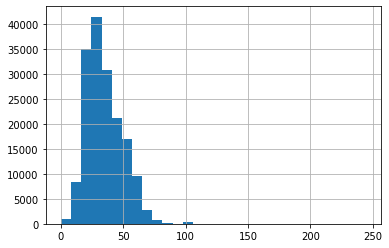

In [ ]:
users.age.hist(bins=30);

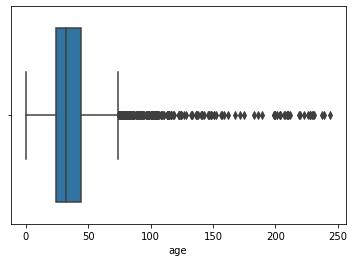

In [ ]:
sns.boxplot(x='age', data=users);

Убираем выбросы в возрастах пользователей и заменяем на медиану.

In [ ]:
users.loc[(users.age < 5) | (users.age > 90), 'age'] = np.nan

In [ ]:
users.age.fillna(round(users.age.median()), inplace=True)

In [ ]:
users.isna().sum()

user_id     0
location    0
age         0
dtype: int64

In [ ]:
users['age'] = users['age'].astype('int')

In [ ]:
users

,user_id,location,age
0,1,"nyc, new york, usa",32
1,2,"stockton, california, usa",18
2,3,"moscow, yukon territory, russia",32
3,4,"porto, v.n.gaia, portugal",17
4,5,"farnborough, hants, united kingdom",32
...,...,...,...
278853,278854,"portland, oregon, usa",32
278854,278855,"tacoma, washington, united kingdom",50
278855,278856,"brampton, ontario, canada",32
278856,278857,"knoxville, tennessee, usa",32


Предобработаем локации, вычленив последний объект, обозначающий страну.

In [ ]:
len(users.location.unique())

57339

In [ ]:
users['country'] = users['location'].apply(lambda f: f.split(',')[-1].strip().rstrip('"'))

In [ ]:
users.country.nunique()

631

In [ ]:
users.country.value_counts()

usa               139712
canada             21658
united kingdom     18556
germany            17073
spain              13258
                   ...  
orange co              1
diy                    1
slo                    1
victoria               1
ferrara                1
Name: country, Length: 631, dtype: int64

In [ ]:
users_num_by_country = users.groupby('country', as_index=False)\
                            .agg({'user_id': 'count'})\
                            .rename(columns={'user_id': 'users_num'})\
                            .sort_values(by='users_num', ascending=False)
users_num_by_country

,country,users_num
587,usa,139712
106,canada,21658
572,united kingdom,18556
218,germany,17073
502,spain,13258
...,...,...
325,london,1
323,lleida,1
322,lkjlj,1
321,lj,1


In [ ]:
users_num_by_country[:20]

,country,users_num
587,usa,139712
106,canada,21658
572,united kingdom,18556
218,germany,17073
502,spain,13258
47,australia,11785
273,italy,11271
0,,4588
207,france,3487
434,portugal,3390


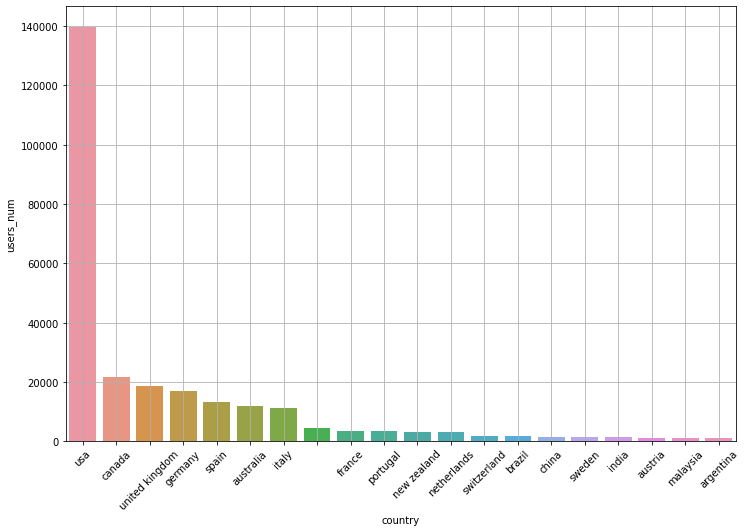

In [ ]:
plt.figure(figsize=(12, 8))
sns.barplot(x='country', 
            y='users_num', 
            data=users_num_by_country[:20])
plt.xticks(rotation=45)
plt.grid()

In [ ]:
users_num_by_country[users_num_by_country.users_num < 30]

,country,users_num
159,deutschland,29
584,urugua,29
28,algeria,29
149,cyprus,27
36,antarctica,27
...,...,...
325,london,1
323,lleida,1
322,lkjlj,1
321,lj,1


Видно, что и в странах много неточностей (опечатки, города вместо стран и т.д.). 

Пусть будем рекомендовать пользователям из стран, где меньше всего заказывают и где явная опечатка (пропуск, например), то, что заказывают в США (как в наиболее популярной стране).

In [ ]:
users.loc[users.country == '', 'country'] = 'usa'
users.loc[users.country == 'n/a', 'country'] = 'usa'

In [ ]:
less_popular_countries = users_num_by_country[users_num_by_country.users_num < 10].country

for country in less_popular_countries:
    users.loc[users.country == country, 'country'] = 'usa'

#### Обработка books

In [ ]:
# обработка author
books[books.book_author.isna()]

,isbn,book_title,book_author,year_of_publication,publisher,image_url_s,image_url_m,image_url_l
187689,9627982032,The Credit Suisse Guide to Managing Your Perso...,NaN,1995,Edinburgh Financial Publishing,http://images.amazon.com/images/P/9627982032.0...,http://images.amazon.com/images/P/9627982032.0...,http://images.amazon.com/images/P/9627982032.0...


In [ ]:
books.book_author.fillna('other', inplace=True)

In [ ]:
# обработка publisher
books[books.publisher.isna()]

,isbn,book_title,book_author,year_of_publication,publisher,image_url_s,image_url_m,image_url_l
128890,193169656X,Tyrant Moon,Elaine Corvidae,2002,NaN,http://images.amazon.com/images/P/193169656X.0...,http://images.amazon.com/images/P/193169656X.0...,http://images.amazon.com/images/P/193169656X.0...
129037,1931696993,Finders Keepers,Linnea Sinclair,2001,NaN,http://images.amazon.com/images/P/1931696993.0...,http://images.amazon.com/images/P/1931696993.0...,http://images.amazon.com/images/P/1931696993.0...


In [ ]:
books.publisher.fillna('other', inplace=True)

In [ ]:
# убираем ненужные url изображений
books.drop(['image_url_m', 'image_url_s'], axis=1, inplace=True)

In [ ]:
books.isna().sum()

isbn                   0
book_title             0
book_author            0
year_of_publication    0
publisher              0
image_url_l            3
dtype: int64

In [ ]:
# год публикации
books.year_of_publication.unique()

array([2002, 2001, 1991, 1999, 2000, 1993, 1996, 1988, 2004, 1998, 1994,
       2003, 1997, 1983, 1979, 1995, 1982, 1985, 1992, 1986, 1978, 1980,
       1952, 1987, 1990, 1981, 1989, 1984, 0, 1968, 1961, 1958, 1974,
       1976, 1971, 1977, 1975, 1965, 1941, 1970, 1962, 1973, 1972, 1960,
       1966, 1920, 1956, 1959, 1953, 1951, 1942, 1963, 1964, 1969, 1954,
       1950, 1967, 2005, 1957, 1940, 1937, 1955, 1946, 1936, 1930, 2011,
       1925, 1948, 1943, 1947, 1945, 1923, 2020, 1939, 1926, 1938, 2030,
       1911, 1904, 1949, 1932, 1928, 1929, 1927, 1931, 1914, 2050, 1934,
       1910, 1933, 1902, 1924, 1921, 1900, 2038, 2026, 1944, 1917, 1901,
       2010, 1908, 1906, 1935, 1806, 2021, '2000', '1995', '1999', '2004',
       '2003', '1990', '1994', '1986', '1989', '2002', '1981', '1993',
       '1983', '1982', '1976', '1991', '1977', '1998', '1992', '1996',
       '0', '1997', '2001', '1974', '1968', '1987', '1984', '1988',
       '1963', '1956', '1970', '1985', '1978', '1973', '1980'

Видим, что есть странные строковые значения, не относящиеся к году публикации книги.

In [ ]:
books[books['year_of_publication'] == 'DK Publishing Inc']

,isbn,book_title,book_author,year_of_publication,publisher,image_url_l
209538,078946697X,"DK Readers: Creating the X-Men, How It All Beg...",2000,DK Publishing Inc,http://images.amazon.com/images/P/078946697X.0...,NaN
221678,0789466953,"DK Readers: Creating the X-Men, How Comic Book...",2000,DK Publishing Inc,http://images.amazon.com/images/P/0789466953.0...,NaN


In [ ]:
books[books['year_of_publication'] == 'Gallimard']

,isbn,book_title,book_author,year_of_publication,publisher,image_url_l
220731,2070426769,"Peuple du ciel, suivi de 'Les Bergers\"";Jean-M...",2003,Gallimard,http://images.amazon.com/images/P/2070426769.0...,NaN


In [ ]:
books[books.isbn == '078946697X']

,isbn,book_title,book_author,year_of_publication,publisher,image_url_l
209538,078946697X,"DK Readers: Creating the X-Men, How It All Beg...",2000,DK Publishing Inc,http://images.amazon.com/images/P/078946697X.0...,NaN


In [ ]:
wrong_books_isbn = ['078946697X', '0789466953', '2070426769']

for isbn in wrong_books_isbn:
    books.loc[books.isbn == isbn, 'image_url_l'] =\
    books[books.isbn == isbn].publisher
    
    books.loc[books.isbn == isbn, 'publisher'] =\
    books[books.isbn == isbn].year_of_publication
    
    books.loc[books.isbn == isbn, 'year_of_publication'] =\
    books[books.isbn == isbn].book_author

Заменим самостоятельно название и автора в тех случаях, где данные "съехали".

In [ ]:
books.loc[books.isbn == '078946697X', 'book_author'] =\
    'Michael Teitelbaum'
books.loc[books.isbn == '078946697X', 'book_title'] =\
    'DK Readers: Creating the X-Men, How It All Began (Level 4: Proficient Readers)'

In [ ]:
books.loc[books.isbn == '0789466953', 'book_author'] =\
    'James Buckley'
books.loc[books.isbn == '0789466953', 'book_title'] =\
    'DK Readers: Creating the X-Men, How Comic Books Come to Life (Level 4: Proficient Readers)'

In [ ]:
books.loc[books.isbn == '2070426769', 'book_author'] =\
    'Jean-Marie Gustave, Le Clézio'
books.loc[books.isbn == '2070426769', 'book_title'] =\
    'Peuple du ciel, suivi de Les bergers'

In [ ]:
# проверим, все ли нормально предобработалось
for isbn in wrong_books_isbn:
    display(books[books.isbn == isbn])

,isbn,book_title,book_author,year_of_publication,publisher,image_url_l
209538,078946697X,"DK Readers: Creating the X-Men, How It All Beg...",Michael Teitelbaum,2000,DK Publishing Inc,http://images.amazon.com/images/P/078946697X.0...


,isbn,book_title,book_author,year_of_publication,publisher,image_url_l
221678,0789466953,"DK Readers: Creating the X-Men, How Comic Book...",James Buckley,2000,DK Publishing Inc,http://images.amazon.com/images/P/0789466953.0...


,isbn,book_title,book_author,year_of_publication,publisher,image_url_l
220731,2070426769,"Peuple du ciel, suivi de Les bergers","Jean-Marie Gustave, Le Clézio",2003,Gallimard,http://images.amazon.com/images/P/2070426769.0...


In [ ]:
books['year_of_publication'] = books['year_of_publication'].astype('float64')

Убираем года публикации, которые выходят за рамки года публикации самого датасета и заменяем на медиану.

In [ ]:
books.loc[(books.year_of_publication > 2006) | (books.year_of_publication == 0),'year_of_publication'] = np.nan

In [ ]:
books.isna().sum()

isbn                      0
book_title                0
book_author               0
year_of_publication    4641
publisher                 0
image_url_l               0
dtype: int64

In [ ]:
books.year_of_publication.fillna(round(books.year_of_publication.median()), inplace=True)

In [ ]:
books.isna().sum()

isbn                   0
book_title             0
book_author            0
year_of_publication    0
publisher              0
image_url_l            0
dtype: int64

In [ ]:
books['year_of_publication'] = books['year_of_publication'].astype('int')

In [ ]:
books.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 6 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   isbn                 271360 non-null  object
 1   book_title           271360 non-null  object
 2   book_author          271360 non-null  object
 3   year_of_publication  271360 non-null  int64 
 4   publisher            271360 non-null  object
 5   image_url_l          271360 non-null  object
dtypes: int64(1), object(5)
memory usage: 12.4+ MB


#### Обработка interactions

interactions в предобработке уже не нуждается, но стоит посмотреть на данные.

In [ ]:
interactions.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110519 entries, 0 to 110518
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   user_id      110519 non-null  int64 
 1   isbn         110519 non-null  object
 2   book_rating  110519 non-null  int64 
 3   user_num     110519 non-null  int64 
 4   books_num    110519 non-null  int64 
 5   picture_url  110519 non-null  object
 6   book_title   110519 non-null  object
 7   product_id   110519 non-null  int64 
 8   vid          110519 non-null  int64 
dtypes: int64(6), object(3)
memory usage: 8.4+ MB


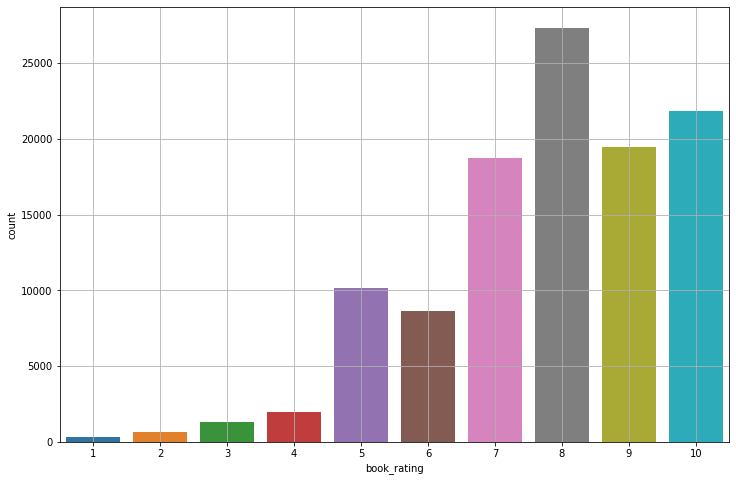

In [ ]:
plt.figure(figsize=(12, 8))
sns.countplot(x='book_rating', 
            data=interactions)
plt.grid()

In [ ]:
interactions = interactions.merge(users, on=["user_id"])

In [ ]:
interactions.drop(['location'], axis=1, inplace=True)

### Вспомогательное

In [ ]:
# вспомогательные функции для отрисовки рекомендаций
def chunks(l, n):
    for i in range(0, len(l), n):
        yield l[i:i + n]

def rec_imaging(product_ids, content_dict, measure=None, top_n=5):
    picture_urls = [content_dict[i] for i in product_ids]
    cnt = 0
    for idx, chunk in enumerate(chunks(picture_urls, top_n)):
        fig = plt.figure(figsize=(20, 4))
        for n, i in enumerate(chunk):
            try:
                r = requests.get(i)
                im = Image.open(BytesIO(r.content))

            except:
                print('Something went wrong with {url}'.format(url=i))
                continue

            a = fig.add_subplot(1, top_n, n + 1)
            if measure is not None:
                a.title.set_text("measure = {}".format(np.round(measure[cnt], 4)))
                cnt += 1
            plt.imshow(im)
            plt.axis('off')
        plt.show()

In [ ]:
# поиск id нужных книг
for i, j in interactions[["product_id", "book_title"]].drop_duplicates().values:
    if "Dandelion" in j:
        print("idx:", i, "\tBook Title:", j)

idx: 6521 	Book Title: Dandelion Wine (Grand Master Editions)


### 1. Реализовать персональный топ  - принимает на вход возраст и локацию, на выходе персональный топ   - 1 балл

Персональный топ - это топ товаров по похожим возрасту/интересам/локации. Как сделать? Разбить на сегменты по выбраным признакам. Топ делать по книгам с хорошим средним рейтингом.

In [ ]:
class Top():
    def __init__(self, Int):
        # Создаём словарь для того, чтобы по product_id возвращать url товара
        self.product_id_to_url = {}
        for i in Int[["product_id", "picture_url"]].drop_duplicates().values:
            self.product_id_to_url[i[0]] = i[1]
        self.interactions = Int
        
    def top_items(self, age, country):
        # Хотим получить в отсортированном порядке датафрейм - product_id, user_number
        items = self.interactions[(self.interactions["age"] == age) & (self.interactions["country"] == country)]\
                                                .groupby("product_id")["book_rating"].mean() \
                                                .reset_index() \
                                                .sort_values("book_rating", ascending=False)[:10]
        
        rec_imaging(items["product_id"].values, self.product_id_to_url, items["book_rating"].values)

In [ ]:
T = Top(interactions)

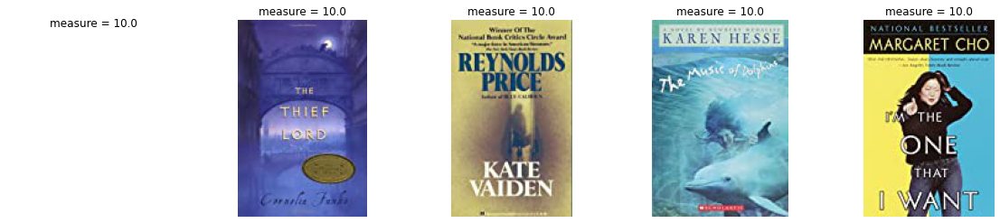

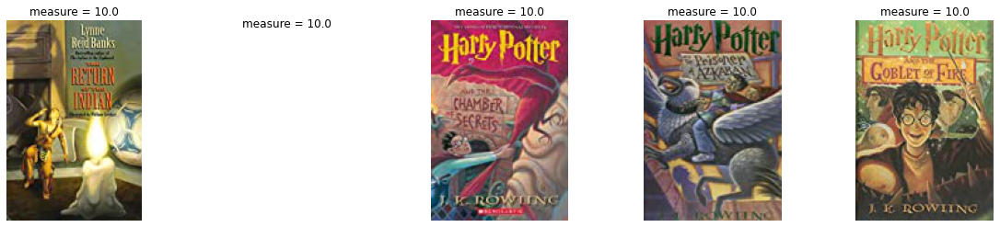

In [ ]:
T.top_items(12, 'usa')

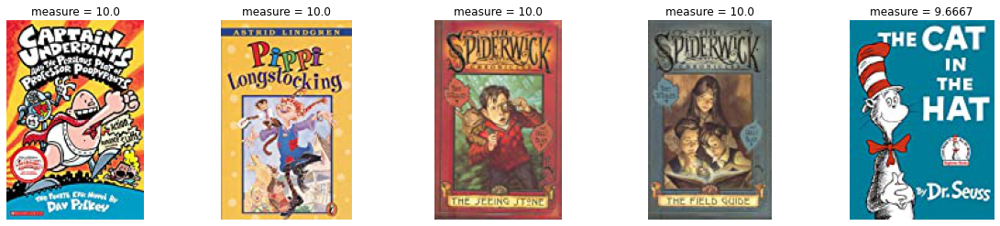

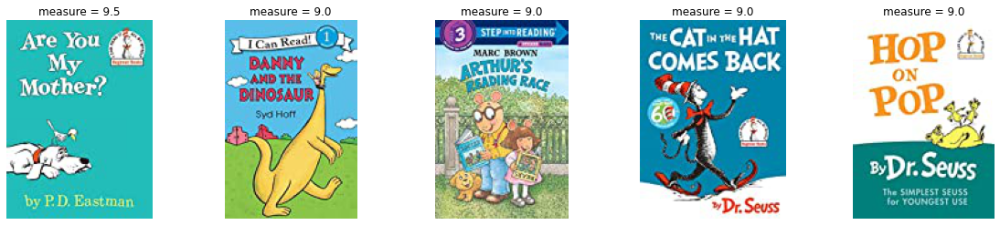

In [ ]:
T.top_items(8, 'usa')

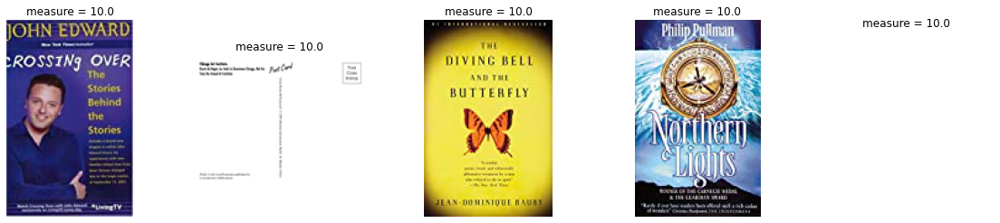

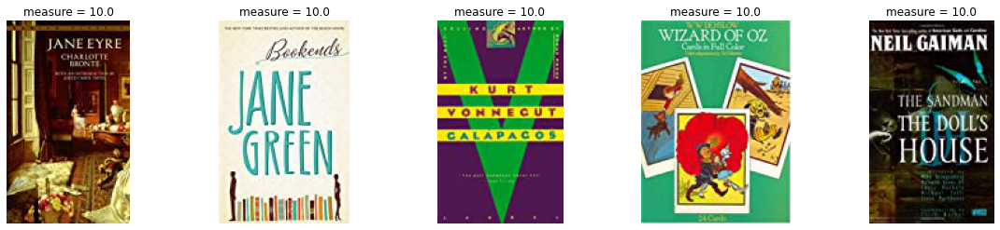

In [ ]:
T.top_items(30, 'united kingdom')

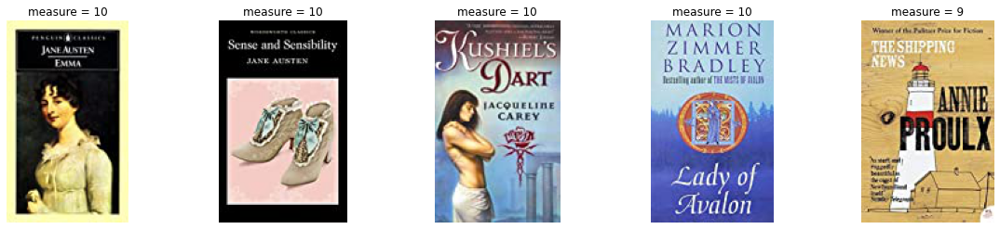

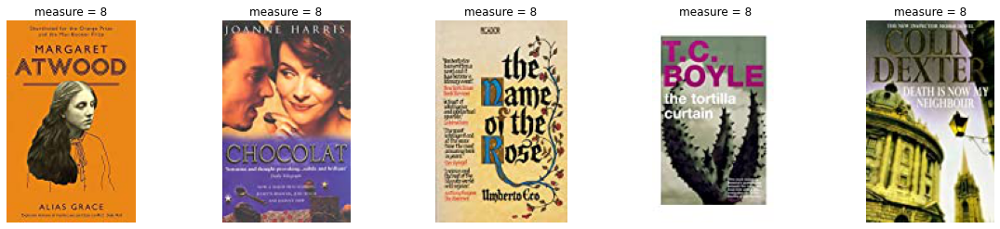

In [ ]:
T.top_items(50, 'united kingdom')

### 2. На основе метода кластеризации похожих пользователей построить рекомендации (Слайд 27) - 2 балла

Нужно топ-10 рекомендаций с самой высокой оценкой. Считаем среднюю оценку для каждой книги по кластеру и выводим топ-10 книг.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import normalize

In [ ]:
class Clusterization():
    def __init__(self, interactions):
        self.content_dict = {}
        for i, j in interactions[["product_id", "picture_url"]].drop_duplicates().values:
            self.content_dict[int(i)] = j
        self.interactions = interactions
        interactions.loc[interactions["book_rating"] < 5, "weight"] = 0
        interactions.loc[interactions["book_rating"] >= 5, "weight"] = 1
        weighted = interactions[["vid", "product_id", "picture_url", "weight"]]
        self.csr_rates = coo_matrix((weighted["weight"], (weighted["vid"], weighted["product_id"])), 
                            shape=(len(set(weighted["vid"])), len(set(weighted["product_id"])))) 
        
    def create_clusters(self):
        csr_rates_matrix = normalize(self.csr_rates)
        model = KMeans(n_clusters=10, random_state=42)
        model.fit_predict(csr_rates_matrix)
        labels = model.labels_
        self.interactions["label"] = self.interactions["vid"].apply(lambda f: labels[f])
    
    def get_rec(self, idx):
        label = self.interactions[self.interactions["vid"] == idx]["label"].values[0]
        items = self.interactions[(self.interactions["label"] == label)]\
                                                .groupby("product_id")["book_rating"].mean() \
                                                .reset_index() \
                                                .sort_values("book_rating", ascending=False)[:10]
        print(f"Для пользователя {idx} такие рекомендации:")
        rec_imaging(items["product_id"].values, self.content_dict, items["book_rating"].values)

In [ ]:
cluster = Clusterization(interactions)

In [ ]:
cluster.create_clusters()

Для пользователя 102 такие рекомендации:


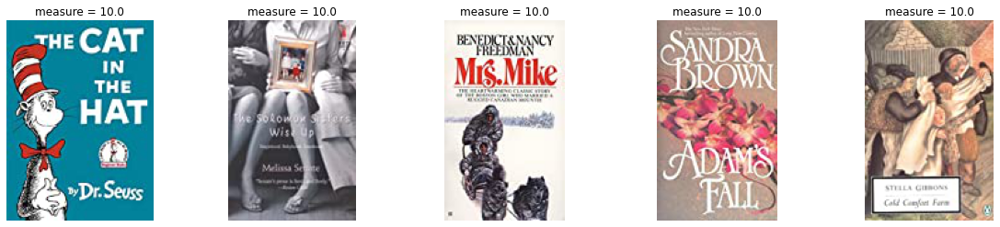

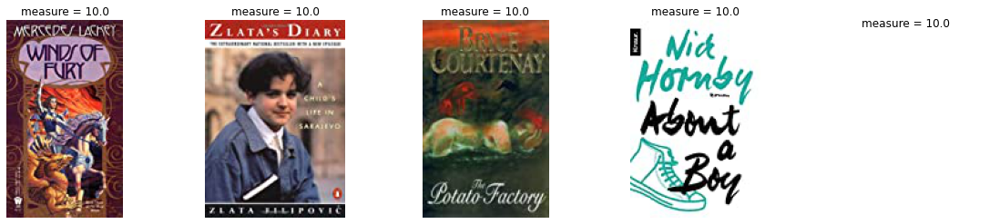

In [ ]:
# cluster 1
cluster.get_rec(102)

Для пользователя 45 такие рекомендации:


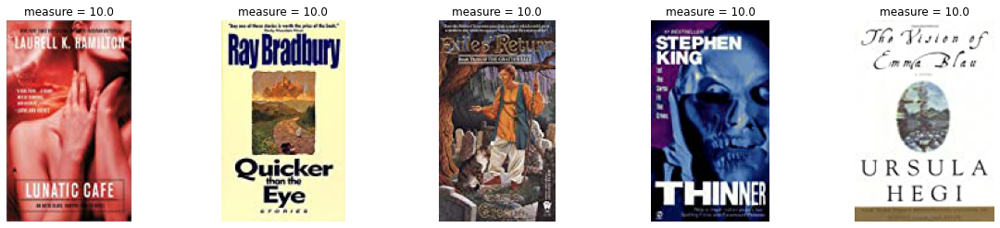

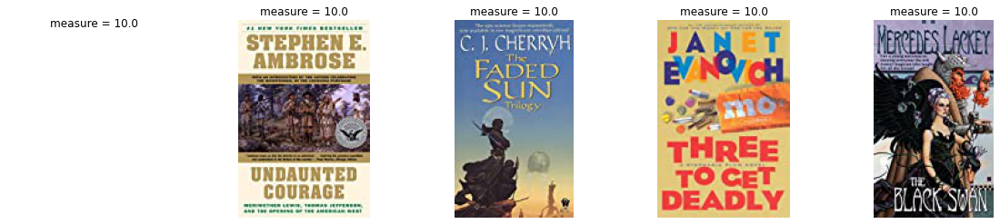

In [ ]:
# cluster 2
cluster.get_rec(45)

Для пользователя 46 такие рекомендации:


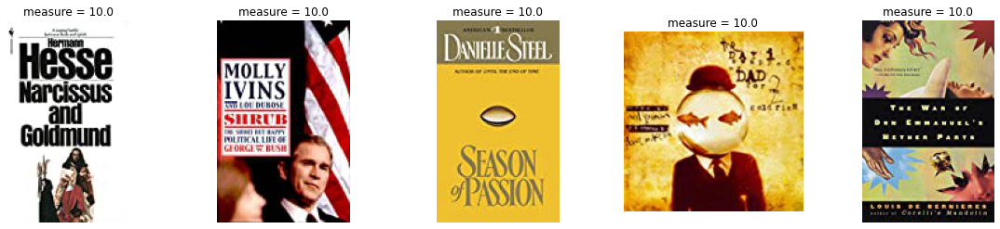

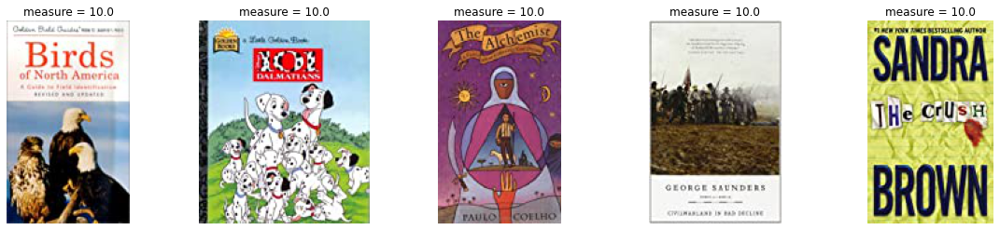

In [ ]:
# cluster 3
cluster.get_rec(46)

Для пользователя 25 такие рекомендации:


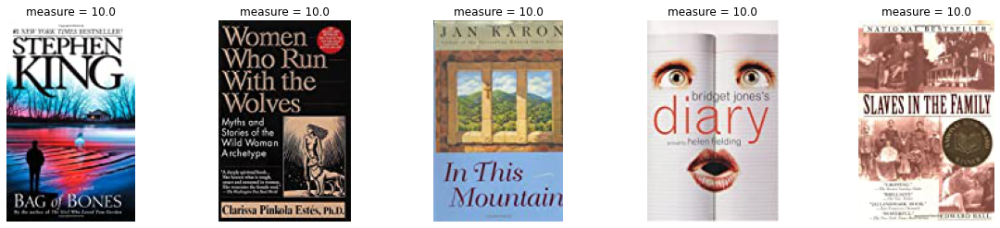

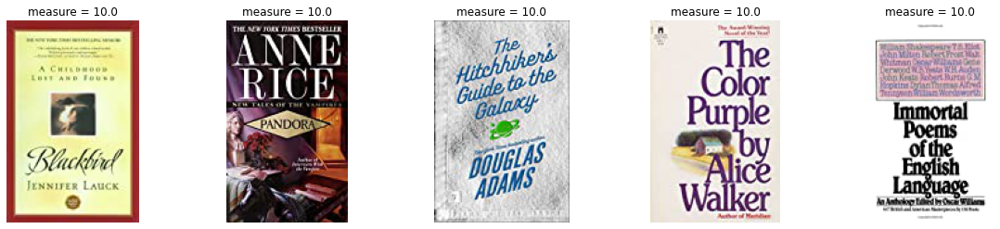

In [ ]:
# cluster 4
cluster.get_rec(25)

Для пользователя 60 такие рекомендации:


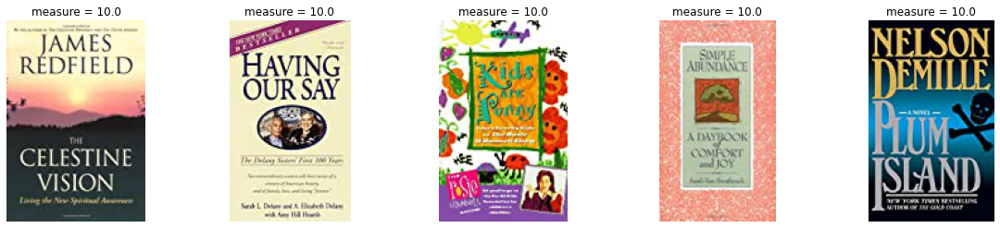

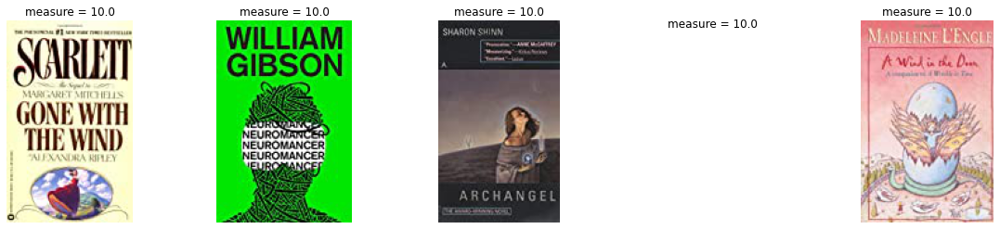

In [ ]:
# cluster 5
cluster.get_rec(60)

### 3. Применить методы расмотренные на лекции (Совстречаемость - 2 балл, Content-based - 1 балл, Коллаборативная фильтрация - 3 балла (51 слайд), Матричная Факторизация - 1 балл) - 7 баллов

В совстречаемости также учитывать оценки. Вес пары книг встретившихся у пользователя - полусумма их оценок

Коллаборативную фильтрацию реализовывать как на слайде 50 презентации, посоветовав каждому пользователю топ-10 книг с самой высокой оценкой. Сделать рекомендации User-based и Item-based и сравнить.

Если совсем сложно - можно сделать как в семинарской части, поставив оценку "0", если рейтинг < 5 и "1" - в противном случае. Тогда максимум за это - 1 балл.

Для Content-based, Коллаборативной фильтрации, Матричной Факторизации реализовать U2I и I2I рекомендации

#### Совстречаемость

In [ ]:
Int_tmp = interactions[["vid", "product_id"]].drop_duplicates()

In [ ]:
user_products = Int_tmp.groupby(["vid"])["product_id"].apply(list).reset_index()

In [ ]:
user_products[:3]

,vid,product_id
0,0,[0]
1,1,"[5415, 5105, 1386, 1393, 1710]"
2,2,"[7386, 5064, 5014, 5628, 6956, 5067]"


In [ ]:
class Recomendations():
    def __init__(self, Int):
        # Создаём словарь для того, чтобы по product_id возвращать url товара
        self.product_id_to_url = {}
        for i in Int[["product_id", "picture_url"]].drop_duplicates().values:
            self.product_id_to_url[i[0]] = i[1]
        self.interactions = Int
        
    def coocurrency_count(self):
        Int = self.interactions[["vid", "product_id", "book_rating"]].drop_duplicates()
        # Для каждого пользователя собираем товары, с которыми он взамиодействовал
        user_products = Int.groupby(["vid"])["product_id"].apply(list).reset_index()
        user_products_rating = Int.groupby(["vid"])["book_rating"].apply(list).reset_index()
        user_products = user_products.merge(user_products_rating)
        # Считаем число товаров, с которыми взаимодействовал каждый пользователь и записываем в колонку prod_num
        product_num = [len(i) for i in user_products["product_id"]]
        user_products["prod_num"] = product_num
        # Фильтруем пользователей, взаимодействовавших с одним товаром
        user_products = user_products[user_products["prod_num"] > 1]
        
        # Заводим словарь под товары
        cooc = {}
        for i in tqdm.tqdm_notebook(user_products.values):
            for j in range(len(i[1])):
                for k in range(len(i[1])):
                    if j != k:
                        try:
                            cooc[str(i[1][j]) + "_" + str(i[1][k])] += (i[2][j] + i[2][k]) / 2
                        except:
                            cooc[str(i[1][j]) + "_" + str(i[1][k])] = (i[2][j] + i[2][k]) / 2
        cooc_list = []
        for i, j in cooc.items():
            # Если товары встетились вместе больше одного раза, то добавляем в список
            if j != 1:
                cooc_list.append(i.split("_") + [j])
        self.cooc_rec = pd.DataFrame(cooc_list, columns=["item1", "item2", "measure"])
    
    def get_rec(self, i, show=False):
        recs = self.cooc_rec[self.cooc_rec["item1"] == str(i)]\
                            .sort_values("measure", ascending=False)\
                            .head(10)
        print(u"Для товара")
        rec_imaging([i], self.product_id_to_url)
        print(u"Такие рекомендации")
        rec_imaging(recs["item2"].values.astype(int), self.product_id_to_url, 
                         recs["measure"].values.astype(int))

In [ ]:
cooc_rec = Recomendations(interactions)
cooc_rec.coocurrency_count()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


Для товара


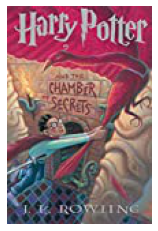

Такие рекомендации


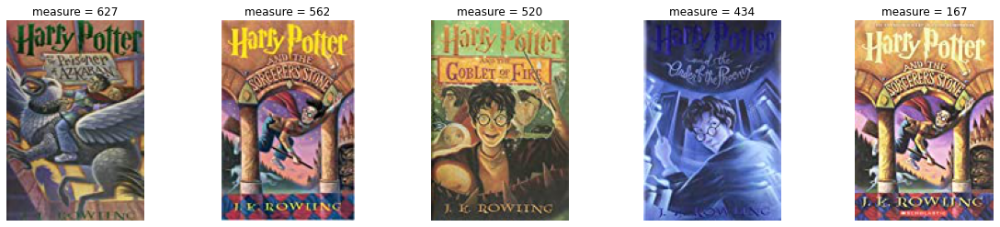

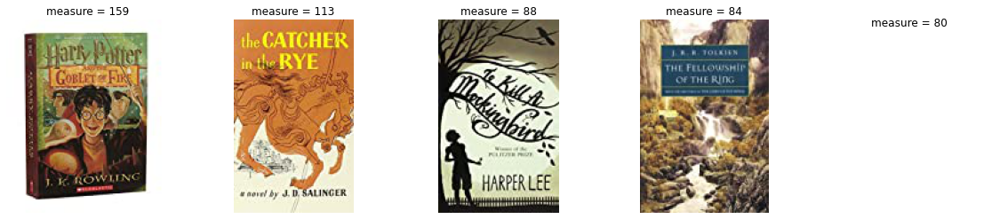

In [ ]:
cooc_rec.get_rec(4216)

Для товара


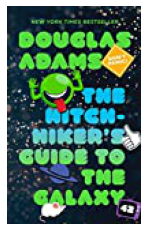

Такие рекомендации


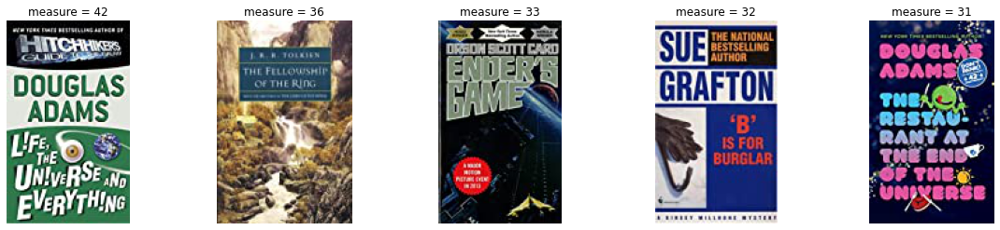

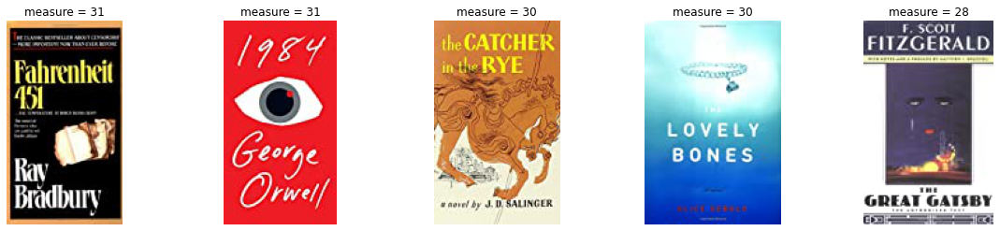

In [ ]:
cooc_rec.get_rec(2094)

Для товара


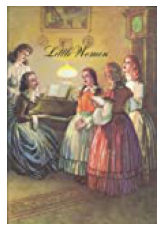

Такие рекомендации


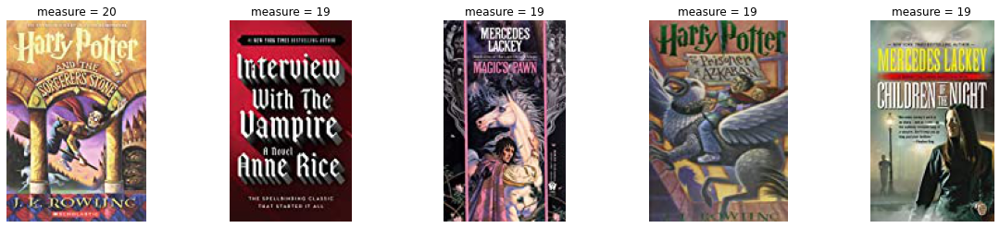

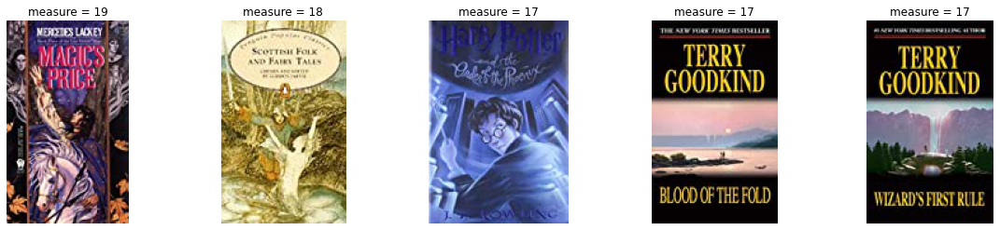

In [ ]:
cooc_rec.get_rec(5119)

Для товара


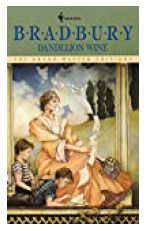

Такие рекомендации


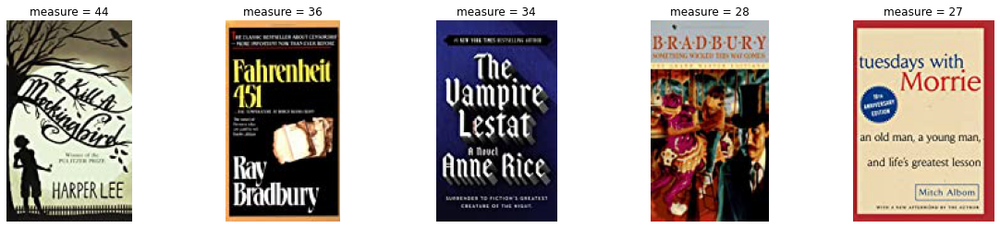

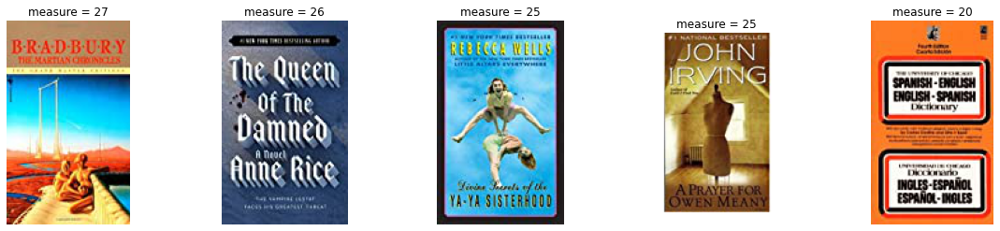

In [ ]:
cooc_rec.get_rec(6521)

#### Content-based

In [ ]:
class Content_Based():
    def __init__(self, items, interactions):
        self.items = items
        self.interactions = interactions.drop_duplicates()
        self.content_dict = {}
        for i, j in enumerate(items["image_url_l"]):
            self.content_dict[i] = j
        self.inversed_dict = {v: k for k, v in self.content_dict.items()}
        
    def avg_feature_vector(self, words, model, num_features, index2word_set):
        feature_vec = np.zeros((num_features, ), dtype='float32')
        n_words = 0
        for word in words:
            if word in index2word_set:
                n_words += 1
                feature_vec = np.add(feature_vec, model.wv[word])
        if (n_words > 0):
            feature_vec = feature_vec / n_words
        return feature_vec

    def get_items_representation(self):
        
        item_description = [gensim.utils.simple_preprocess(re.sub("[^a-zA-Zа-яА-Я]+", " ", i.lower())) 
                            for i in self.items["book_title"]]
        #build vocabulary and train model
        self.model = gensim.models.Word2Vec(
                item_description,
                size=200,
                window=10,
                min_count=1,
                workers=10,
                iter=100)
        self.index2word_set = set(self.model.wv.index2word)
        self.items_embs = np.zeros((len(item_description), 200))
        for i in range(self.items_embs.shape[0]):
            self.items_embs[i] = self.avg_feature_vector(item_description[i], self.model, 200, self.index2word_set)
        
        
    def get_rec_I2I(self, i):
        metrics = cosine_similarity([self.items_embs[i]], self.items_embs)
        print(u"Для товара")
        rec_imaging([i], self.content_dict)
        print(u"Такие рекомендации")
        rec_imaging(np.argsort(metrics)[0][::-1][1:11], self.content_dict, np.sort(metrics)[0][::-1][1:11])


    def get_rec_U2I(self, i):
        ui = self.interactions[self.interactions["vid"] == i]
        user_vector = " ".join(ui["book_title"])
        user_processed = gensim.utils.simple_preprocess(re.sub("[^a-zA-Zа-яА-Я]+", " ", user_vector.lower()))
        user_emb = self.avg_feature_vector(user_processed, self.model, 200, self.index2word_set)
        metrics = cosine_similarity([user_emb], self.items_embs)
        print(u"Для пользователя, который взаимодействовал с товарами")
        rec_imaging(np.unique([self.inversed_dict[i] for i in ui["picture_url"]]), self.content_dict)
        print(u"Такие рекомендации")
        rec_imaging(np.argsort(metrics)[0][::-1][1:11], self.content_dict, np.sort(metrics)[0][::-1][1:11])

In [ ]:
CB = Content_Based(books, interactions)

In [ ]:
CB.get_items_representation()

Для товара


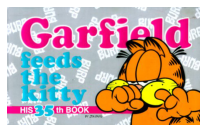

Такие рекомендации


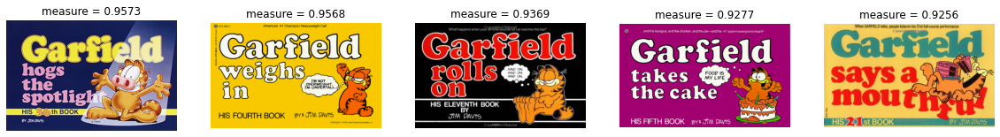

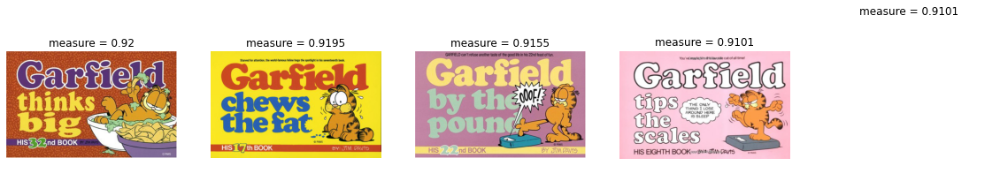

In [ ]:
CB.get_rec_I2I(12345)

Для товара


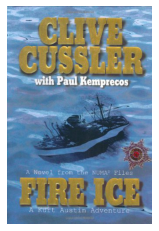

Такие рекомендации


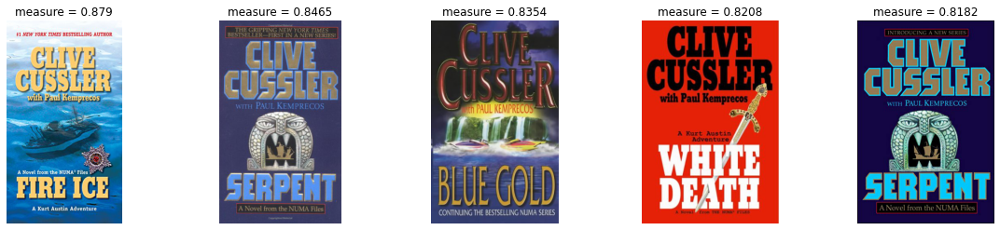

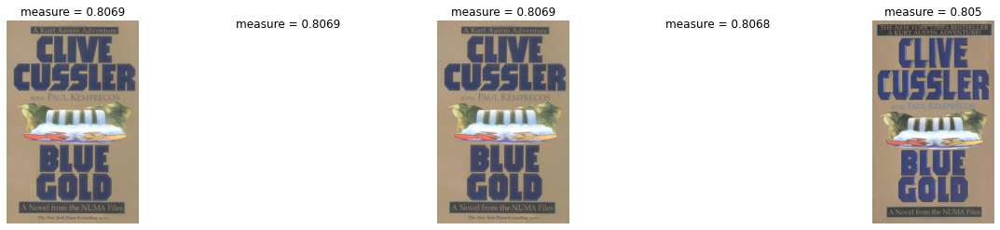

In [ ]:
CB.get_rec_I2I(5000)

Для пользователя, который взаимодействовал с товарами
Такие рекомендации


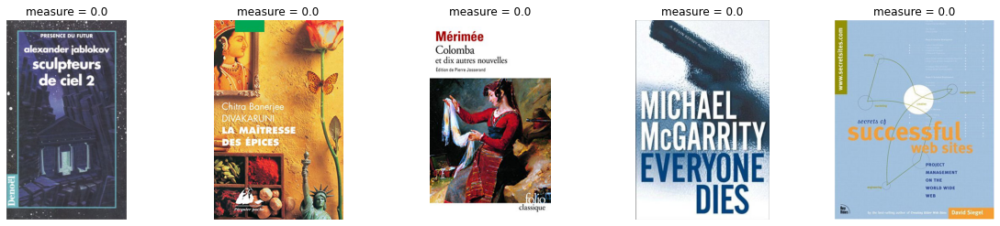

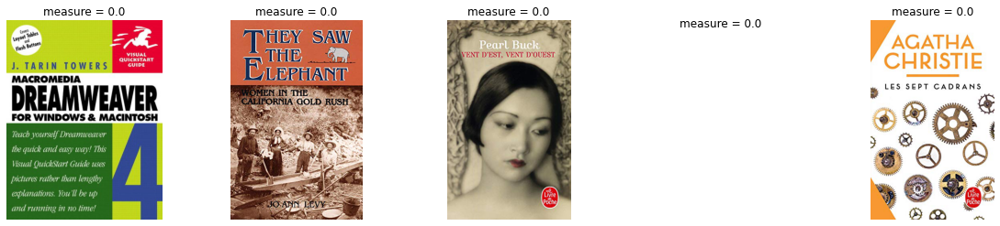

In [ ]:
# не получилось
CB.get_rec_U2I(100000)

#### Коллаборативная фильтрация

In [ ]:
class Colloborative():
    def __init__(self, interactions):
        self.content_dict = {}
        for i, j in interactions[["product_id", "picture_url"]].drop_duplicates().values:
            self.content_dict[int(i)] = j
        interactions.loc[interactions["book_rating"] < 5, "weight"] = 0
        interactions.loc[interactions["book_rating"] >= 5, "weight"] = 1
        weighted = interactions[["vid", "product_id", "picture_url", "weight"]]
        self.csr_rates = coo_matrix((weighted["weight"], (weighted["vid"], weighted["product_id"])), 
                            shape=(len(set(weighted["vid"])), len(set(weighted["product_id"]))))        

    def user_based(self, idx):
        user_rates = self.csr_rates.getrow(idx).toarray()[0]
        watched_items = np.where(user_rates != 0)[0]
        # считаем косинус между пользователем idx и всеми пользователями
        metrics = cosine_similarity([user_rates], self.csr_rates).reshape(-1, 1)
        # домножаем оценки пользователя на коэффициент похожести
        rates = csr_matrix.multiply(self.csr_rates.copy(), metrics)
        # чтобы не рекомендовать уже просмотренные - зануляем веса просмотренных
        total_rate = (1 - user_rates.astype(bool)) * np.array(np.sum(rates, axis=0))[0]
        # печатаем рекомендации
        self.get_rec(watched_items, np.arange(self.csr_rates.shape[1])[np.argsort(total_rate)[::-1][:10]],
                    np.sort(total_rate)[::-1][:10])
        
    def item_based(self, idx):
        item_rates = self.csr_rates.getcol(idx).toarray().reshape(1, -1)
        # считаем косинус между товаром idx и всеми пользователями
        metrics = cosine_similarity(item_rates, self.csr_rates.T).reshape(-1, 1)
        # домножаем оценки пользователя на коэффициент похожести
        rates = csr_matrix.multiply(self.csr_rates.T.copy(), metrics)
        total_rate = np.array(np.sum(rates, axis=1)).ravel()
        # печатаем рекомендации
        self.get_rec([idx], np.arange(self.csr_rates.shape[1])[np.argsort(total_rate)[::-1][:10]],
                    np.sort(total_rate)[::-1][:10])

    def get_rec(self, watched, recs, measure):
        print(u"Для таких товаров")
        rec_imaging([i for i in watched], self.content_dict)
        print(u"Такие рекомендации")
        rec_imaging([i for i in recs], self.content_dict, measure)

In [ ]:
clb = Colloborative(interactions)

Для таких товаров


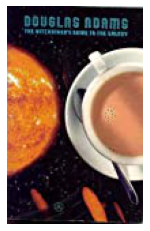

Такие рекомендации


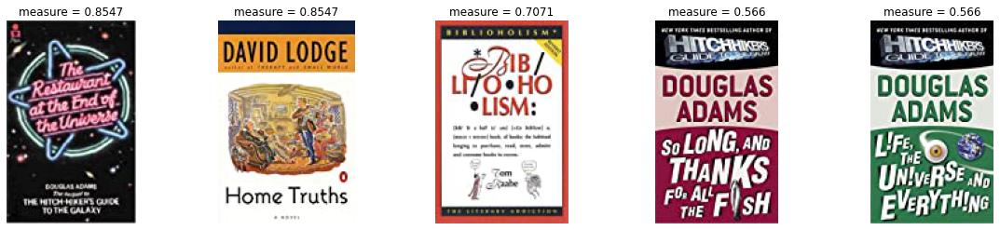

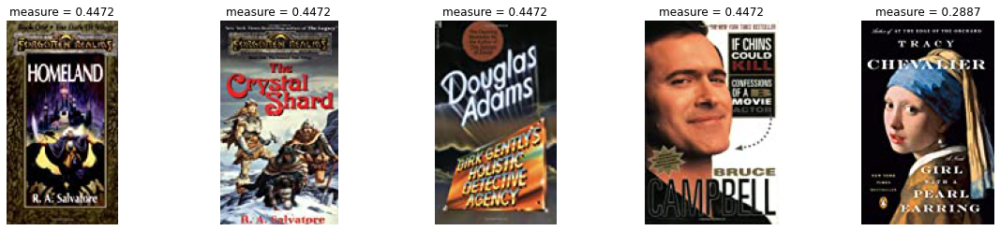

In [ ]:
clb.user_based(10000)

Для таких товаров


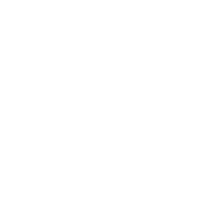

Такие рекомендации


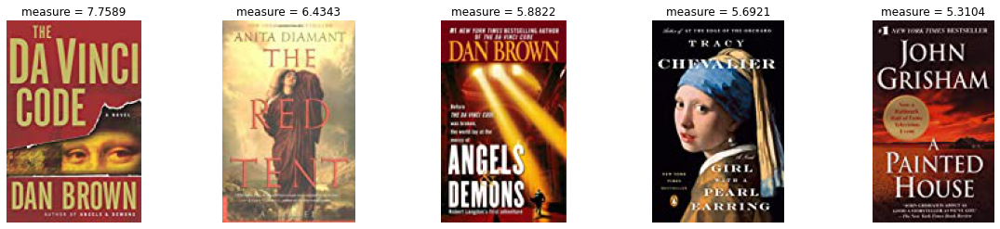

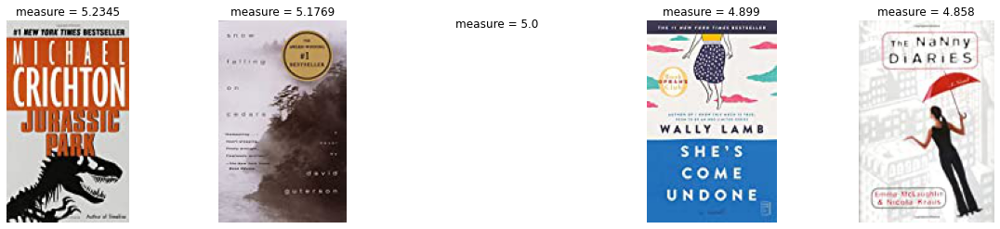

In [ ]:
clb.item_based(10000)

In [ ]:
# по формулам
class Colloborative():
    def __init__(self, interactions):
        self.content_dict = {}
        for i, j in interactions[["product_id", "picture_url"]].drop_duplicates().values:
            self.content_dict[int(i)] = j
        interactions.loc[interactions["book_rating"] < 5, "weight"] = 0
        interactions.loc[interactions["book_rating"] >= 5, "weight"] = 1
        weighted = interactions[["vid", "product_id", "picture_url", "weight"]]
        self.csr_rates = coo_matrix((weighted["weight"], (weighted["vid"], weighted["product_id"])), 
                            shape=(len(set(weighted["vid"])), len(set(weighted["product_id"]))))        

    def user_based(self, idx):
        user_rates = self.csr_rates.getrow(idx).toarray()[0]
        watched_items = np.where(user_rates != 0)[0]
        # считаем косинус между пользователем idx и всеми пользователями
        metrics = cosine_similarity([user_rates], self.csr_rates).reshape(-1, 1)
        r_vi = self.csr_rates.copy()
        r_v_mean = self.csr_rates.mean(axis=1)
        csr_rates_new = r_vi - r_v_mean
        # домножаем оценки пользователя на коэффициент похожести
        rates = np.multiply(csr_rates_new, metrics)
        rates_new = user_rates.mean() + np.array(np.sum(rates, axis=0))[0] / np.sum(metrics, axis=0)
        # чтобы не рекомендовать уже просмотренные - зануляем веса просмотренных
        total_rate = (1 - user_rates.astype(bool)) * rates_new
        # печатаем рекомендации
        self.get_rec(watched_items, np.arange(self.csr_rates.shape[1])[np.argsort(total_rate)[::-1][:10]],
                    np.sort(total_rate)[::-1][:10])
        
    def item_based(self, idx):
        item_rates = self.csr_rates.getcol(idx).toarray().reshape(1, -1)
        # считаем косинус между товаром idx и всеми пользователями
        metrics = cosine_similarity(item_rates, self.csr_rates.T).reshape(-1, 1)
        r_uj = self.csr_rates.copy()
        r_j_mean = self.csr_rates.mean(axis=0)
        csr_rates_new = r_uj - r_j_mean
        # домножаем оценки пользователя на коэффициент похожести
        rates = np.multiply(csr_rates_new.T, metrics)
        total_rate = item_rates.mean() + np.array(np.sum(rates, axis=0))[0] / np.sum(metrics, axis=0)
        # печатаем рекомендации
        self.get_rec([idx], np.arange(self.csr_rates.shape[1])[np.argsort(total_rate)[::-1][:10]],
                    np.sort(total_rate)[::-1][:10])

    def get_rec(self, watched, recs, measure):
        print(u"Для таких товаров")
        rec_imaging([i for i in watched], self.content_dict)
        print(u"Такие рекомендации")
        rec_imaging([i for i in recs], self.content_dict, measure)

In [ ]:
clb = Colloborative(interactions)

Для таких товаров


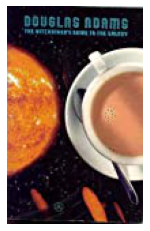

Такие рекомендации


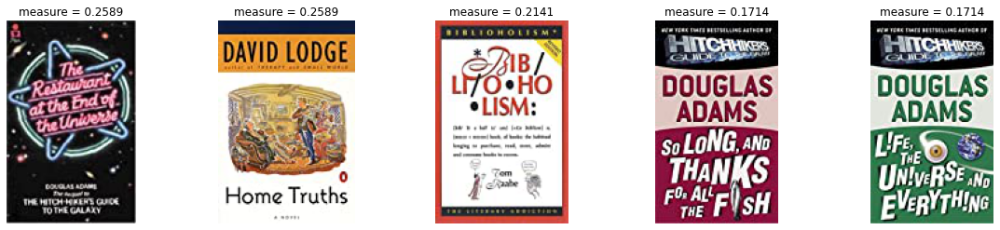

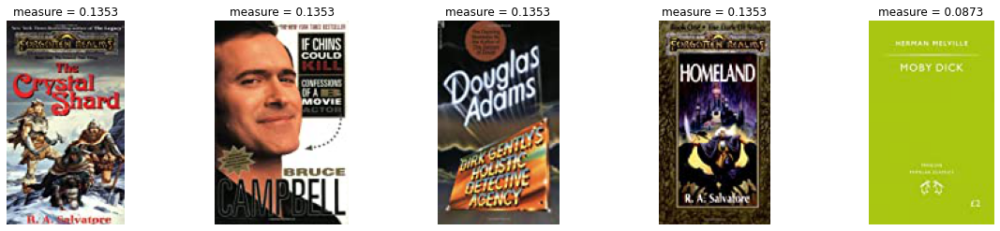

In [ ]:
clb.user_based(10000)

Для таких товаров


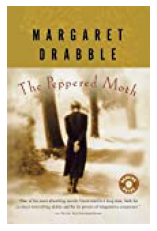

Такие рекомендации


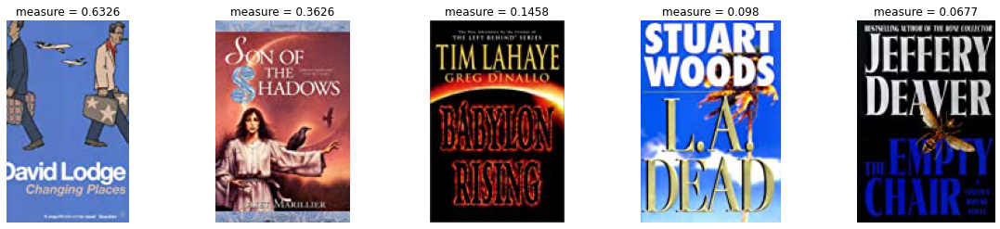

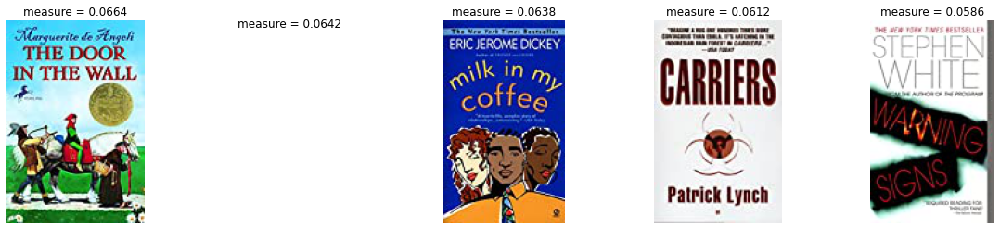

In [ ]:
clb.item_based(1234)

#### Матричная Факторизация

In [ ]:
class MatrixFactorization():  
    def __init__(self, interactions, k):
        interactions["product_id"] = interactions["product_id"].astype(int)
        self.k = k
        self.content_dict = {}
        for i, j in interactions[["product_id", "picture_url"]].drop_duplicates().values:
            self.content_dict[i] = j
        interactions.loc[interactions["book_rating"] < 5, "weight"] = 0
        interactions.loc[interactions["book_rating"] >= 5, "weight"] = 1
        weighted = interactions[["vid", "product_id", "picture_url", "weight"]]
        self.csr_rates = coo_matrix((weighted["weight"], (weighted["vid"], weighted["product_id"])), 
                            shape=(len(set(weighted["vid"])), len(set(weighted["product_id"]))))
        
    def MF(self):
        U, S, V = svds(self.csr_rates.astype(float), k=self.k)
        self.user_embs = U
        self.items_embs = V.T
        
    def LightFM(self):
        self.model = LightFM(loss='warp', no_components=100, learning_rate=0.03, learning_schedule="adadelta")
        self.model.fit(self.csr_rates, epochs=5, num_threads=40, verbose=True)
        self.user_feature_bias, self.user_feature_embeddings = self.model.get_user_representations()
        self.item_feature_bias, self.items_embs = self.model.get_item_representations()

    def get_rec(self, i):
        metrics = cosine_similarity([self.items_embs[i]], self.items_embs)
        print(u"Для товара")
        rec_imaging([i], self.content_dict)
        print(u"Такие рекомендации")
        rec_imaging(np.argsort(-metrics)[0][1:11], self.content_dict, -np.round(np.sort(-metrics)[0][1:11], 4))

In [ ]:
simple_svd = MatrixFactorization(interactions, 30)
simple_svd.MF()

Для товара


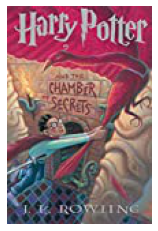

Такие рекомендации


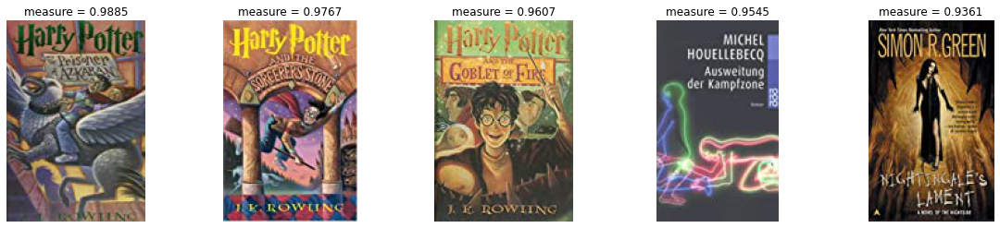

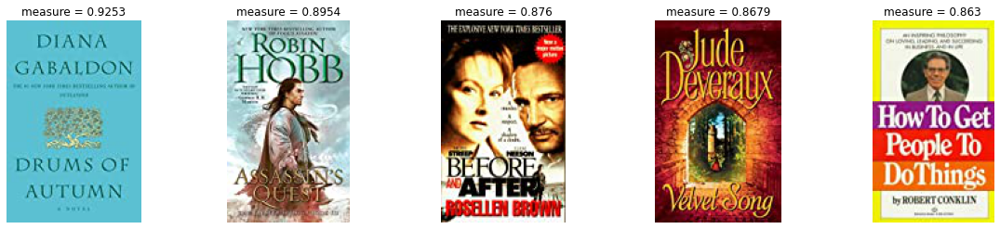

In [ ]:
simple_svd.get_rec(4216)

# LightFM

In [ ]:
mf = MatrixFactorization(interactions, 300)
mf.LightFM()

Epoch: 100%|██████████| 5/5 [00:03<00:00,  1.38it/s]


Для товара


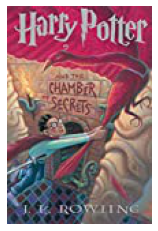

Такие рекомендации


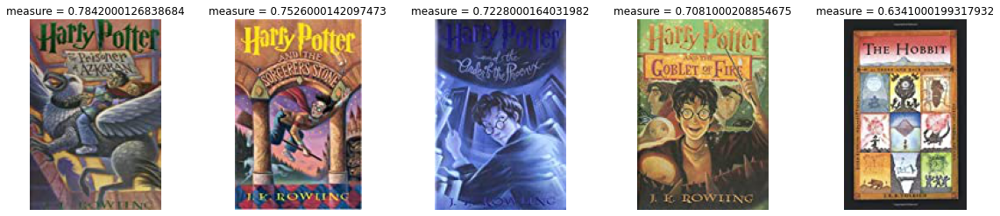

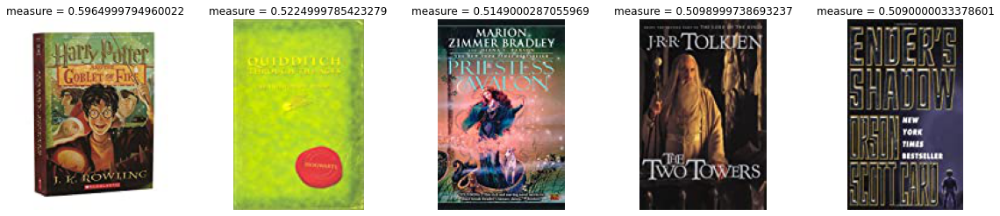

In [ ]:
mf.get_rec(4216)